In [1]:
import numpy as np
import pandas as pd

In [2]:
load_data_inputs_train=pd.read_csv('loan_data_inputs_train.csv', index_col=0)
load_data_targets_train=pd.read_csv('loan_data_targets_train.csv',index_col=0,header=None)
load_data_inputs_test=pd.read_csv('loan_data_inputs_test.csv',index_col=0)
load_data_targets_test=pd.read_csv('loan_data_targets_test.csv',index_col=0,header=None)

/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
load_data_inputs_train.head()

,Unnamed: 0.1,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:20-25,dti:25-30,dti:30-35,dti:35-40,dti:>40,mths_since_last_record:Missing,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
427211,427211,12796369,14818505,24000,24000,24000.0,36 months,8.90,762.08,A,...,1,0,0,0,0,1,0,0,0,0
206088,206088,1439740,1691948,10000,10000,10000.0,36 months,14.33,343.39,C,...,0,0,0,0,0,1,0,0,0,0
136020,136020,5214749,6556909,20425,20425,20425.0,36 months,8.90,648.56,A,...,0,0,0,0,0,1,0,0,0,0
412305,412305,13827698,15890016,17200,17200,17200.0,36 months,16.59,609.73,D,...,0,0,0,0,0,1,0,0,0,0
36159,36159,422455,496525,8400,8400,7450.0,36 months,12.84,282.40,C,...,1,0,0,0,0,1,0,0,0,0


In [4]:
load_data_targets_train.head()

,1
0,
NaN,good_bad
427211.0,1
206088.0,1
136020.0,1
412305.0,0


In [5]:
load_data_targets_train=load_data_targets_train.drop(load_data_targets_train.index[0])

In [6]:
#load_data_targets_train=load_data_targets_train.iloc[1:]

In [7]:
load_data_targets_train.head()

,1
0,
427211.0,1
206088.0,1
136020.0,1
412305.0,0
36159.0,0


In [8]:
load_data_inputs_train.shape

(373028, 338)

In [9]:
load_data_targets_train.shape

(373028, 1)

In [10]:
load_data_inputs_test.shape

(93257, 338)

In [11]:
load_data_targets_test.shape

(93258, 1)

In [12]:
load_data_targets_test.head()

,1
0,
NaN,good_bad
362514.0,1
288564.0,1
213591.0,1
263083.0,1


In [13]:
load_data_targets_test=load_data_targets_test.drop(load_data_targets_test.index[0])

In [14]:
load_data_targets_test.head()

,1
0,
362514.0,1
288564.0,1
213591.0,1
263083.0,1
165001.0,1


In [15]:
load_data_targets_test.shape

(93257, 1)

In [16]:
feature_selection=[
'grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NC_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Verified',
'verification_status:Source Verified',
'verification_status:Not Verified',
    'purpose:educ_sm_b_wedd_ren_en_mov_house',
    'purpose:small_business',
    'purpose:educational',
    'purpose:renewable_energy',
    'purpose:moving',
    'purpose:house',
    'purpose:other',
    'purpose:medical',
    'purpose:wedding',
    'purpose:vacation',
    'purpose:debt_consolidation',
    'purpose:home_improvement',
    'purpose:major_purchase',
    'purpose:car',
    'purpose:credit_card',
    'initial_list_status:f',
    'initial_list_status:w',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issued_date:<38',
'mths_since_issued_date:38-39',
'mths_since_issued_date:40-41',
'mths_since_issued_date:42-48',
'mths_since_issued_date:49-52',
'mths_since_issued_date:53-64',
'mths_since_issued_date:65-84',
'mths_since_issued_date:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:20.281',
    'mths_since_earliest_cr_line:<140',
    'mths_since_earliest_cr_line:140-239',
    'mths_since_earliest_cr_line:240-339',
    'mths_since_earliest_cr_line:340-439',
    'mths_since_earliest_cr_line:440-539',
    'mths_since_earliest_cr_line:540-600',
    'mths_since_earliest_cr_line:>600',
    'delinq_2yrs:0',
    'delinq_2yrs:0-3',
    'delinq_2yrs:3-7',
    'delinq_2yrs:7-9',
    'delinq_2yrs:9-11',
    'delinq_2yrs:11-12',
    'delinq_2yrs:12-18',
    'delinq_2yrs:>18',
    'inq_last_6mths:0',
    'inq_last_6mths:0-3',
    'inq_last_6mths:3-7',
    'inq_last_6mths:7-9',
    'inq_last_6mths:9-11',
    'inq_last_6mths:11-12',
    'inq_last_6mths:12-18',
    'inq_last_6mths:18',
    'open_acc:>=0',
    'open_acc:0-1',
    'open_acc:1-4',
    'open_acc:4-28',
    'open_acc:28-35',
    'open_acc:35-45',
    'open_acc:<45',
    'pub_rec:0-3',
    'pub_rec:3-6',
    'pub_rec:6-8',
    'pub_rec:8',
    'total_acc:<0',
    'total_acc:0-4',
    'total_acc:4-62',
    'total_acc:62-72',
    'total_acc:72-85',
    'total_acc:>85',
    'acc_now_delinq:<0',
    'acc_now_delinq:0-1',
    'acc_now_delinq:1-2',
    'acc_now_delinq:2-3',
    'acc_now_delinq:3-5',
    'acc_now_delinq:>5',
'annual_inc:<20k',
'annual_inc:20k-30k',
'annual_inc:30k-40k',
'annual_inc:40k-50k',
'annual_inc:50k-60k',
'annual_inc:60k-70k',
'annual_inc:70k-80k',
'annual_inc:80k-90k',
'annual_inc:90k-100k',
'annual_inc:100k-120k',
'annual_inc:120k-140k',
'annual_inc:>140k',
'total_rev_hi_lim:<=5k',
'total_rev_hi_lim:5k_10k',
'total_rev_hi_lim:10k_20k',
'total_rev_hi_lim:20k_30k',
'total_rev_hi_lim:30k_40k',
'total_rev_hi_lim:40k_50k',
'total_rev_hi_lim:50k_65k',
'total_rev_hi_lim:65k_80k',
'total_rev_hi_lim:>80k',
'dti:<5',
'dti:5-10',
'dti:10-15',
'dti:15-20',
'dti:20-25',
'dti:25-30',
'dti:30-35',
'dti:35-40',
'dti:>40',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-90',
'mths_since_last_record:90-120',
'mths_since_last_record:120-127',
'mths_since_last_record:>=127']



In [17]:
inputs_train_with_ref_category = load_data_inputs_train.reindex(feature_selection, axis='columns')

In [18]:
inputs_train_with_ref_category.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 373028 entries, 427211 to 121958
Columns: 148 entries, grade:A to mths_since_last_record:>=127
dtypes: int64(148)
memory usage: 424.1 MB


In [19]:
inputs_train_with_ref_category.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,...,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
427211,1,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,0,0
206088,0,0,1,0,0,0,0,0,0,1,...,0,0,1,0,0,1,0,0,0,0
136020,1,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,0,0
412305,0,0,0,1,0,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,0
36159,0,0,1,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,0,0


In [20]:
ref_categories=['grade:G',
               'home_ownership:RENT_OTHER_NONE_ANY',
               'addr_state:ND_NE_IA_NC_FL_HI_AL',
               'verification_status:Verified',
                'purpose:educ_sm_b_wedd_ren_en_mov_house',
                'initial_list_status:f',
                'term:60',
                'emp_length:0',
                'mths_since_issued_date:>84',
                'int_rate:20.281',
                'mths_since_earliest_cr_line:<140',
                'delinq_2yrs:>18',
                'inq_last_6mths:7-9',
                'open_acc:>=0',
                'pub_rec:0-3',
                'total_acc:>85',
                'acc_now_delinq:<0',
                'total_rev_hi_lim:<=5k',
                'annual_inc:<20k',
                'dti:>40',
                'mths_since_last_delinq:0-3',
                'mths_since_last_record:Missing'
               ]

In [21]:
inputs_train=inputs_train_with_ref_category.drop(ref_categories, axis=1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,...,dti:30-35,dti:35-40,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
427211,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
206088,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0


PD MODLE ESTIMATION

Logistic Regression

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [23]:
reg = LogisticRegression()

In [24]:
pd.options.display.max_rows = None

In [25]:
inputs_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 373028 entries, 427211 to 121958
Columns: 126 entries, grade:A to mths_since_last_record:>=127
dtypes: int64(126)
memory usage: 361.4 MB


In [26]:
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,...,dti:30-35,dti:35-40,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
427211,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
206088,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [27]:
np.isnan(inputs_train).any()
#np.nan_to_num(inputs_train
#np.where(np.isnan(inputs_train))
#inputs_train=np.where(inputs_train.values >= np.finfo(np.float64).max)

grade:A                                False
grade:B                                False
grade:C                                False
grade:D                                False
grade:E                                False
grade:F                                False
home_ownership:OWN                     False
home_ownership:MORTGAGE                False
addr_state:NM_VA                       False
addr_state:OK_TN_MO_LA_MD_NC           False
addr_state:UT_KY_AZ_NJ                 False
addr_state:AR_MI_PA_OH_MN              False
addr_state:RI_MA_DE_SD_IN              False
addr_state:GA_WA_OR                    False
addr_state:WI_MT                       False
addr_state:IL_CT                       False
addr_state:KS_SC_CO_VT_AK_MS           False
addr_state:WV_NH_WY_DC_ME_ID           False
verification_status:Source Verified    False
verification_status:Not Verified       False
purpose:small_business                 False
purpose:educational                    False
purpose:re

In [28]:
#inputs_train=inputs_train.astype(float)

In [29]:
#inputs_train['verification_status:Source Verified'].fillna('0',inplace=True)


In [30]:
#inputs_train['verification_status:Source Verified'].isnull().sum()

In [31]:
"""inputs_train['acc_now_delinq:0-1'].fillna('0',inplace=True)
inputs_train['acc_now_delinq:1-2'].fillna('0',inplace=True)
inputs_train['acc_now_delinq:2-3'].fillna('0',inplace=True)
inputs_train['acc_now_delinq:3-5'].fillna('0',inplace=True)
inputs_train['acc_now_delinq:>5'].fillna('0',inplace=True)"""

"inputs_train['acc_now_delinq:0-1'].fillna('0',inplace=True)\ninputs_train['acc_now_delinq:1-2'].fillna('0',inplace=True)\ninputs_train['acc_now_delinq:2-3'].fillna('0',inplace=True)\ninputs_train['acc_now_delinq:3-5'].fillna('0',inplace=True)\ninputs_train['acc_now_delinq:>5'].fillna('0',inplace=True)"

In [32]:
"""inputs_train['verification_status:Source Verified']=inputs_train['verification_status:Source Verified'].astype(int)
inputs_train['acc_now_delinq:0-1']=inputs_train['acc_now_delinq:0-1'].astype(float)
inputs_train['acc_now_delinq:1-2']=inputs_train['acc_now_delinq:1-2'].astype(float)
inputs_train['acc_now_delinq:2-3']=inputs_train['acc_now_delinq:2-3'].astype(float)
inputs_train['acc_now_delinq:3-5']=inputs_train['acc_now_delinq:3-5'].astype(float)
inputs_train['acc_now_delinq:>5']=inputs_train['acc_now_delinq:>5'].astype(float)"""

"inputs_train['verification_status:Source Verified']=inputs_train['verification_status:Source Verified'].astype(int)\ninputs_train['acc_now_delinq:0-1']=inputs_train['acc_now_delinq:0-1'].astype(float)\ninputs_train['acc_now_delinq:1-2']=inputs_train['acc_now_delinq:1-2'].astype(float)\ninputs_train['acc_now_delinq:2-3']=inputs_train['acc_now_delinq:2-3'].astype(float)\ninputs_train['acc_now_delinq:3-5']=inputs_train['acc_now_delinq:3-5'].astype(float)\ninputs_train['acc_now_delinq:>5']=inputs_train['acc_now_delinq:>5'].astype(float)"

In [33]:
load_data_targets_train=load_data_targets_train.astype(float)

In [34]:
reg.fit(inputs_train,load_data_targets_train)

/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [35]:
reg.intercept_

array([-0.09246259])

In [36]:
reg.coef_

array([[ 2.00278703e+00,  1.10272450e+00,  8.45389440e-01,
         6.64069016e-01,  3.88245445e-01,  1.19687040e-01,
         1.16174776e-01,  1.23471884e-01, -3.52350104e-02,
        -1.60589595e-02,  6.23547323e-03,  6.34552376e-02,
         2.36388493e-02,  1.13329179e-01,  1.74249590e-01,
         1.88024427e-01,  2.52849481e-01,  4.40561057e-01,
         6.15382876e-02,  1.23060807e-01, -4.75555042e-01,
        -2.55948491e-01, -7.03446787e-03, -1.06839905e-01,
        -5.65027776e-02, -1.19195955e-03, -3.80813374e-02,
         3.17286302e-01,  1.24697844e-01, -6.36793421e-03,
        -1.27014251e-02,  1.41525445e-01,  1.93387471e-01,
         9.31773283e-02,  1.09828655e-01,  6.43520111e-02,
         8.27958220e-02,  1.11706859e-01,  6.22824917e-02,
         4.35686869e-02,  1.11571993e-01,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  9.50503495e-01,  4.56136539e-01,
         0.00000000e+00,  3.30819071e-01,  1.37534468e-0

In [37]:
feature_name= inputs_train.columns.values

In [38]:
summary_table=pd.DataFrame(columns= ['Feature name'],data= feature_name)
summary_table['Coefficients'] = np.transpose(reg.coef_)
summary_table.index=summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-0.092463
1,grade:A,2.002787
2,grade:B,1.102725
3,grade:C,0.845389
4,grade:D,0.664069
5,grade:E,0.388245
6,grade:F,0.119687
7,home_ownership:OWN,0.116175
8,home_ownership:MORTGAGE,0.123472
9,addr_state:NM_VA,-0.035235


Build a Logistic Regression Model with P-Values

In [39]:
from sklearn import linear_model

In [40]:
import scipy.stats as stat

In [41]:
class LogisticRegression_with_Pvalues:
       
   
        
        
    def __init__(self,*args,**kwargs):
        self.model = linear_model.LogisticRegression(*args,**kwargs)

    def fit(self,X,y):
        self.model.fit(X,y)
        denom = (2.0*(1.0+np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom,(X.shape[1],1)).T
        F_ij = np.dot((X/denom).T,X) 
        Cramer_Rao = np.linalg.pinv(F_ij) 
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
        z_scores = self.model.coef_[0]/sigma_estimates 
        p_values = [stat.norm.sf(abs(x))*2 for x in z_scores] 
        self.coef_=self.model.coef_
        self.intercept_=self.model.intercept_
        self.z_scores = z_scores
        self.p_values = p_values
        self.sigma_estimates = sigma_estimates
        self.F_ij = F_ij
       
        
        
        
   
           

In [42]:
reg =LogisticRegression_with_Pvalues()

In [43]:
reg.fit(inputs_train,load_data_targets_train)

/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
<ipython-input-41-1d3ac646f188>:15: RuntimeWarning: invalid value encountered in sqrt
  sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
<ipython-input-41-1d3ac646f188>:16: RuntimeWarning: invalid value

In [44]:

    summary_table=pd.DataFrame(columns= ['Feature name'],data= feature_name)
    summary_table['Coefficients'] = np.transpose(reg.coef_)
    summary_table.index=summary_table.index + 1
    summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
    summary_table = summary_table.sort_index()
    summary_table
    
   

,Feature name,Coefficients
0,Intercept,-0.092463
1,grade:A,2.002787
2,grade:B,1.102725
3,grade:C,0.845389
4,grade:D,0.664069
5,grade:E,0.388245
6,grade:F,0.119687
7,home_ownership:OWN,0.116175
8,home_ownership:MORTGAGE,0.123472
9,addr_state:NM_VA,-0.035235


In [45]:
p_values = reg.p_values

In [46]:
p_values = np.append(np.nan,np.array(p_values))

In [47]:
summary_table['p_values'] = p_values

In [48]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-0.092463,NaN
1,grade:A,2.002787,0.000000e+00
2,grade:B,1.102725,4.773911e-92
3,grade:C,0.845389,6.770576e-58
4,grade:D,0.664069,8.171933e-38
5,grade:E,0.388245,6.821857e-16
6,grade:F,0.119687,1.736164e-02
7,home_ownership:OWN,0.116175,7.435107e-09
8,home_ownership:MORTGAGE,0.123472,7.226814e-23
9,addr_state:NM_VA,-0.035235,2.227247e-01


In [49]:
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,...,dti:30-35,dti:35-40,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
427211,1,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
206088,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
136020,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
412305,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
36159,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [50]:
reg2=LogisticRegression_with_Pvalues()

In [51]:
reg2.fit(inputs_train,load_data_targets_train)

/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
<ipython-input-41-1d3ac646f188>:15: RuntimeWarning: invalid value encountered in sqrt
  sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
<ipython-input-41-1d3ac646f188>:16: RuntimeWarning: invalid value

In [52]:
feature_name= inputs_train.columns.values

In [53]:
    summary_table=pd.DataFrame(columns= ['Feature name'],data= feature_name)
    summary_table['Coefficients'] = np.transpose(reg.coef_)
    summary_table.index=summary_table.index + 1
    summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
    summary_table = summary_table.sort_index()
    summary_table

,Feature name,Coefficients
0,Intercept,-0.092463
1,grade:A,2.002787
2,grade:B,1.102725
3,grade:C,0.845389
4,grade:D,0.664069
5,grade:E,0.388245
6,grade:F,0.119687
7,home_ownership:OWN,0.116175
8,home_ownership:MORTGAGE,0.123472
9,addr_state:NM_VA,-0.035235


In [54]:
p_values = reg2.p_values
p_values = np.append(np.nan, np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-0.092463,NaN
1,grade:A,2.002787,0.000000e+00
2,grade:B,1.102725,4.773911e-92
3,grade:C,0.845389,6.770576e-58
4,grade:D,0.664069,8.171933e-38
5,grade:E,0.388245,6.821857e-16
6,grade:F,0.119687,1.736164e-02
7,home_ownership:OWN,0.116175,7.435107e-09
8,home_ownership:MORTGAGE,0.123472,7.226814e-23
9,addr_state:NM_VA,-0.035235,2.227247e-01


In [55]:
import pickle

In [56]:
pickle.dump(reg2, open('pd_model.sav', 'wb'))

PD Model Validation(Test)

Out-of-Sample validation (test)

In [57]:
inputs_test_with_ref_category= load_data_inputs_test.reindex(feature_selection, axis='columns')

In [58]:
ref_categories=['grade:G',
               'home_ownership:RENT_OTHER_NONE_ANY',
               'addr_state:ND_NE_IA_NC_FL_HI_AL',
               'verification_status:Verified',
                'purpose:educ_sm_b_wedd_ren_en_mov_house',
                'initial_list_status:f',
                'term:60',
                'emp_length:0',
                'mths_since_issued_date:>84',
                'int_rate:20.281',
                'mths_since_earliest_cr_line:<140',
                'delinq_2yrs:>18',
                'inq_last_6mths:7-9',
                'open_acc:>=0',
                'pub_rec:0-3',
                'total_acc:>85',
                'acc_now_delinq:<0',
                'total_rev_hi_lim:<=5k',
                'annual_inc:<20k',
                'dti:>40',
                'mths_since_last_delinq:0-3',
                'mths_since_last_record:Missing'
               ]

In [59]:
#inputs_test_with_ref_category['acc_now_delinq']

In [60]:
inputs_test= inputs_test_with_ref_category.drop(ref_categories,axis=1)
inputs_test.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,...,dti:30-35,dti:35-40,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
362514,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
288564,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
213591,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
263083,0,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
165001,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0


In [61]:
np.isnan(inputs_test).any()

grade:A                                False
grade:B                                False
grade:C                                False
grade:D                                False
grade:E                                False
grade:F                                False
home_ownership:OWN                     False
home_ownership:MORTGAGE                False
addr_state:NM_VA                       False
addr_state:OK_TN_MO_LA_MD_NC           False
addr_state:UT_KY_AZ_NJ                 False
addr_state:AR_MI_PA_OH_MN              False
addr_state:RI_MA_DE_SD_IN              False
addr_state:GA_WA_OR                    False
addr_state:WI_MT                       False
addr_state:IL_CT                       False
addr_state:KS_SC_CO_VT_AK_MS           False
addr_state:WV_NH_WY_DC_ME_ID           False
verification_status:Source Verified    False
verification_status:Not Verified       False
purpose:small_business                 False
purpose:educational                    False
purpose:re

In [62]:
#inputs_test['verification_status:Source Verified grade'].isnull().sum()

In [63]:
#inputs_test['acc_now_delinq:0-1'].fillna('0',inplace=True)

In [64]:
#inputs_test['acc_now_delinq:0-1'].isnull().sum()

In [65]:
#inputs_test['acc_now_delinq:1-2'].fillna('0',inplace=True)


In [66]:
#inputs_test['acc_now_delinq:1-2'].isnull().sum()

In [67]:
#inputs_test['acc_now_delinq:2-3'].fillna('0',inplace=True)

In [68]:
#inputs_test['acc_now_delinq:2-3'].isnull().sum()

In [69]:
#inputs_test['acc_now_delinq:3-5'].fillna('0',inplace=True)

In [70]:
#inputs_test['acc_now_delinq:3-5'].isnull().sum()

In [71]:
y_hat_test = reg2.model.predict(inputs_test)

In [72]:
a=y_hat_test.astype(int)

In [73]:
a.dtype

dtype('int64')

In [74]:
y_hat_test_proba = reg2.model.predict_proba(inputs_test)

In [75]:
y_hat_test_proba

array([[0.11156189, 0.88843811],
       [0.13626626, 0.86373374],
       [0.1131247 , 0.8868753 ],
       ...,
       [0.02365026, 0.97634974],
       [0.04392622, 0.95607378],
       [0.03586918, 0.96413082]])

In [76]:
y_hat_test_proba[: ][: ,1]

array([0.88843811, 0.86373374, 0.8868753 , ..., 0.97634974, 0.95607378,
       0.96413082])

In [77]:
y_hat_test_proba=y_hat_test_proba[: ][: ,1]

In [78]:
y_hat_test_proba

array([0.88843811, 0.86373374, 0.8868753 , ..., 0.97634974, 0.95607378,
       0.96413082])

In [79]:
loan_data_targets_test_temp = load_data_targets_test

In [80]:
loan_data_targets_test_temp.reset_index(drop= True, inplace= True)

In [81]:
df_actual_predicted_probs = pd.concat([loan_data_targets_test_temp,pd.DataFrame(y_hat_test_proba)], axis=1)

In [82]:
df_actual_predicted_probs.shape

(93257, 2)

In [83]:
df_actual_predicted_probs.columns = ['load_data_targets_test','y_hat_test_proba']

In [84]:
df_actual_predicted_probs.index=load_data_inputs_test.index

In [85]:
df_actual_predicted_probs.head()

,load_data_targets_test,y_hat_test_proba
362514,1,0.888438
288564,1,0.863734
213591,1,0.886875
263083,1,0.939082
165001,1,0.975352


In [86]:
#df_actual_predicted_probs['y_hat_test_proba']=df_actual_predicted_probs['y_hat_test_proba'].astype(int)

Accuracy and Areas under the Curve

In [87]:
tr = 0.9
df_actual_predicted_probs['y_hat_test']= np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1,0)

In [88]:
pd.crosstab(df_actual_predicted_probs['load_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
    rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,7337,2853
1,36160,46907


In [89]:
pd.crosstab(df_actual_predicted_probs['load_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
    rownames = ['Actual'], colnames = ['Predicted'])/df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.078675,0.030593
1,0.387746,0.502986


In [90]:
(pd.crosstab(df_actual_predicted_probs['load_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
            rownames=  ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0,0] + (pd.crosstab(df_actual_predicted_probs['load_data_targets_test'],df_actual_predicted_probs['y_hat_test'],
            rownames=  ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1,1]

0.5816614302411615

In [91]:
from sklearn.metrics import roc_curve, roc_auc_score 

In [94]:
roc_curve(df_actual_predicted_probs['load_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'],pos_label=0)

/Users/sushmita/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:811: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn("No positive samples in y_true, "


(array([0.00000000e+00, 1.07230556e-05, 1.63312137e-02, 1.63526599e-02,
        2.25184168e-02, 2.25398630e-02, 3.18367522e-02, 3.18581983e-02,
        3.71661109e-02, 3.71875570e-02, 5.20926043e-02, 5.21140504e-02,
        7.21232722e-02, 7.21447184e-02, 7.35816078e-02, 7.36030539e-02,
        7.71523853e-02, 7.71738315e-02, 9.21539402e-02, 9.21753863e-02,
        1.00871784e-01, 1.00893231e-01, 1.15530201e-01, 1.15551648e-01,
        1.20055331e-01, 1.20076777e-01, 1.21792466e-01, 1.21813912e-01,
        1.59012192e-01, 1.59033638e-01, 1.65135057e-01, 1.65156503e-01,
        1.74549900e-01, 1.74571346e-01, 1.97196993e-01, 1.97218439e-01,
        2.08145233e-01, 2.08166679e-01, 2.12177102e-01, 2.12198548e-01,
        2.13764114e-01, 2.13785560e-01, 2.15436911e-01, 2.15458357e-01,
        2.31360649e-01, 2.31382095e-01, 2.42534073e-01, 2.42555519e-01,
        2.47477401e-01, 2.47498847e-01, 2.50125996e-01, 2.50147442e-01,
        2.65610088e-01, 2.65631534e-01, 2.75378792e-01, 2.754109

In [96]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['load_data_targets_test'],
                                df_actual_predicted_probs['y_hat_test_proba'],pos_label=0)

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

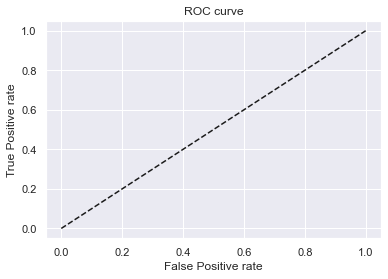

In [98]:
plt.plot(fpr,tpr)
plt.plot(fpr,fpr,linestyle = '--' , color='k')
plt.xlabel('False Positive rate')
plt.ylabel('True Positive rate')
plt.title('ROC curve')

In [99]:
AUROC=roc_auc_score(df_actual_predicted_probs['load_data_targets_test'],
                                df_actual_predicted_probs['y_hat_test_proba'])
AUROC


0.6965058350039228

Gini and kolmogorov-Smlrnov

In [100]:
df_actual_predicted_probs = df_actual_predicted_probs.sort_values('y_hat_test_proba')

In [101]:
df_actual_predicted_probs.head()

,load_data_targets_test,y_hat_test_proba,y_hat_test
35448,1,0.413030,0
41663,1,0.416846,0
41353,0,0.418131,0
32798,0,0.441245,0
41676,0,0.446229,0


In [102]:
df_actual_predicted_probs.tail()

,load_data_targets_test,y_hat_test_proba,y_hat_test
262480,1,0.991132,1
275306,1,0.991292,1
267458,1,0.991532,1
332098,1,0.991882,1
242624,1,0.992407,1


In [103]:
df_actual_predicted_probs = df_actual_predicted_probs.reset_index()

In [104]:
df_actual_predicted_probs.head()

,index,load_data_targets_test,y_hat_test_proba,y_hat_test
0,35448,1,0.413030,0
1,41663,1,0.416846,0
2,41353,0,0.418131,0
3,32798,0,0.441245,0
4,41676,0,0.446229,0


In [105]:
df_actual_predicted_probs['load_data_targets_test']=df_actual_predicted_probs['load_data_targets_test'].astype(int)

In [106]:
df_actual_predicted_probs['Cumulative N Population'] = df_actual_predicted_probs.index+1
df_actual_predicted_probs['Cumulative N Good'] = df_actual_predicted_probs['load_data_targets_test'].cumsum()
df_actual_predicted_probs['Cumulative N Bad'] = df_actual_predicted_probs['Cumulative N Population'] - df_actual_predicted_probs['load_data_targets_test'].cumsum()

In [107]:
df_actual_predicted_probs.head()

,index,load_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad
0,35448,1,0.413030,0,1,1,0
1,41663,1,0.416846,0,2,2,0
2,41353,0,0.418131,0,3,2,1
3,32798,0,0.441245,0,4,2,2
4,41676,0,0.446229,0,5,2,3


In [108]:
df_actual_predicted_probs['Cumulative Perc Population'] = df_actual_predicted_probs['Cumulative N Population']/(df_actual_predicted_probs.shape[0])
df_actual_predicted_probs['Cumulative Perc Good'] = df_actual_predicted_probs['Cumulative N Good']/df_actual_predicted_probs['load_data_targets_test'].sum()
df_actual_predicted_probs['Cumulative Perc Bad'] = df_actual_predicted_probs['Cumulative N Bad']/(df_actual_predicted_probs.shape[0] - df_actual_predicted_probs['load_data_targets_test'].sum())

In [109]:
df_actual_predicted_probs.head()

,index,load_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
0,35448,1,0.413030,0,1,1,0,0.000011,0.000012,0.000000
1,41663,1,0.416846,0,2,2,0,0.000021,0.000024,0.000000
2,41353,0,0.418131,0,3,2,1,0.000032,0.000024,0.000098
3,32798,0,0.441245,0,4,2,2,0.000043,0.000024,0.000196
4,41676,0,0.446229,0,5,2,3,0.000054,0.000024,0.000294


In [110]:
df_actual_predicted_probs.tail()

,index,load_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
93252,262480,1,0.991132,1,93253,83063,10190,0.999957,0.999952,1.0
93253,275306,1,0.991292,1,93254,83064,10190,0.999968,0.999964,1.0
93254,267458,1,0.991532,1,93255,83065,10190,0.999979,0.999976,1.0
93255,332098,1,0.991882,1,93256,83066,10190,0.999989,0.999988,1.0
93256,242624,1,0.992407,1,93257,83067,10190,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

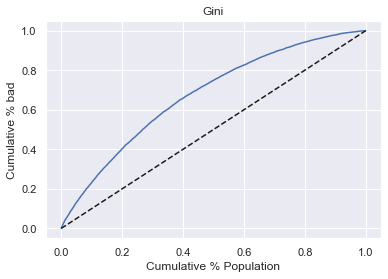

In [111]:
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'],df_actual_predicted_probs['Cumulative Perc Bad'])
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'],df_actual_predicted_probs['Cumulative Perc Population'],linestyle='--', color = 'k')
plt.xlabel('Cumulative % Population')
plt.ylabel('Cumulative % bad')
plt.title('Gini')

In [112]:
Gini =AUROC*2 -1

In [113]:
Gini

0.39301167000784565

Text(0.5, 1.0, 'Kolmogorov-Smirnov')

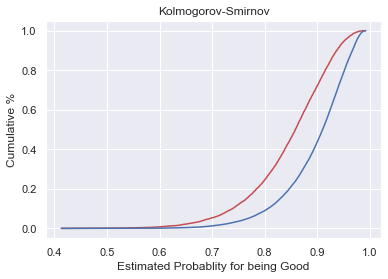

In [114]:
plt.plot(df_actual_predicted_probs['y_hat_test_proba'],df_actual_predicted_probs['Cumulative Perc Bad'],color = 'r')
plt.plot(df_actual_predicted_probs['y_hat_test_proba'],df_actual_predicted_probs['Cumulative Perc Good'],color = 'b')
plt.xlabel('Estimated Probablity for being Good')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov')

In [115]:
KS = max(df_actual_predicted_probs['Cumulative Perc Bad'] - df_actual_predicted_probs['Cumulative Perc Good'])
KS

0.2925267829191123

Applying the PD Model

Calculating PD OF individual accounts

In [116]:
pd.options.display.max_columns = None

In [117]:
inputs_test_with_ref_category.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NC_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Verified,verification_status:Source Verified,verification_status:Not Verified,purpose:educ_sm_b_wedd_ren_en_mov_house,purpose:small_business,purpose:educational,purpose:renewable_energy,purpose:moving,purpose:house,purpose:other,purpose:medical,purpose:wedding,purpose:vacation,purpose:debt_consolidation,purpose:home_improvement,purpose:major_purchase,purpose:car,purpose:credit_card,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issued_date:<38,mths_since_issued_date:38-39,mths_since_issued_date:40-41,mths_since_issued_date:42-48,mths_since_issued_date:49-52,mths_since_issued_date:53-64,mths_since_issued_date:65-84,mths_since_issued_date:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:140-239,mths_since_earliest_cr_line:240-339,mths_since_earliest_cr_line:340-439,mths_since_earliest_cr_line:440-539,mths_since_earliest_cr_line:540-600,mths_since_earliest_cr_line:>600,delinq_2yrs:0,delinq_2yrs:0-3,delinq_2yrs:3-7,delinq_2yrs:7-9,delinq_2yrs:9-11,delinq_2yrs:11-12,delinq_2yrs:12-18,delinq_2yrs:>18,inq_last_6mths:0,inq_last_6mths:0-3,inq_last_6mths:3-7,inq_last_6mths:7-9,inq_last_6mths:9-11,inq_last_6mths:11-12,inq_last_6mths:12-18,inq_last_6mths:18,open_acc:>=0,open_acc:0-1,open_acc:1-4,open_acc:4-28,open_acc:28-35,open_acc:35-45,open_acc:<45,pub_rec:0-3,pub_rec:3-6,pub_rec:6-8,pub_rec:8,total_acc:<0,total_acc:0-4,total_acc:4-62,total_acc:62-72,total_acc:72-85,total_acc:>85,acc_now_delinq:<0,acc_now_delinq:0-1,acc_now_delinq:1-2,acc_now_delinq:2-3,acc_now_delinq:3-5,acc_now_delinq:>5,annual_inc:<20k,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,total_rev_hi_lim:<=5k,total_rev_hi_lim:5k_10k,total_rev_hi_lim:10k_20k,total_rev_hi_lim:20k_30k,total_rev_hi_lim:30k_40k,total_rev_hi_lim:40k_50k,total_rev_hi_lim:50k_65k,total_rev_hi_lim:65k_80k,total_rev_hi_lim:>80k,dti:<5,dti:5-10,dti:10-15,dti:15-20,dti:20-25,dti:25-30,dti:30-35,dti:35-40,dti:>40,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
362514,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
288564,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
213591,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
263083,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0

In [118]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-0.092463,NaN
1,grade:A,2.002787,0.000000e+00
2,grade:B,1.102725,4.773911e-92
3,grade:C,0.845389,6.770576e-58
4,grade:D,0.664069,8.171933e-38
5,grade:E,0.388245,6.821857e-16
6,grade:F,0.119687,1.736164e-02
7,home_ownership:OWN,0.116175,7.435107e-09
8,home_ownership:MORTGAGE,0.123472,7.226814e-23
9,addr_state:NM_VA,-0.035235,2.227247e-01


In [119]:
y_hat_test_proba

array([0.88843811, 0.86373374, 0.8868753 , ..., 0.97634974, 0.95607378,
       0.96413082])

Creating a Scorecard

In [120]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-0.092463,NaN
1,grade:A,2.002787,0.000000e+00
2,grade:B,1.102725,4.773911e-92
3,grade:C,0.845389,6.770576e-58
4,grade:D,0.664069,8.171933e-38
5,grade:E,0.388245,6.821857e-16
6,grade:F,0.119687,1.736164e-02
7,home_ownership:OWN,0.116175,7.435107e-09
8,home_ownership:MORTGAGE,0.123472,7.226814e-23
9,addr_state:NM_VA,-0.035235,2.227247e-01


In [121]:
ref_categories

['grade:G',
 'home_ownership:RENT_OTHER_NONE_ANY',
 'addr_state:ND_NE_IA_NC_FL_HI_AL',
 'verification_status:Verified',
 'purpose:educ_sm_b_wedd_ren_en_mov_house',
 'initial_list_status:f',
 'term:60',
 'emp_length:0',
 'mths_since_issued_date:>84',
 'int_rate:20.281',
 'mths_since_earliest_cr_line:<140',
 'delinq_2yrs:>18',
 'inq_last_6mths:7-9',
 'open_acc:>=0',
 'pub_rec:0-3',
 'total_acc:>85',
 'acc_now_delinq:<0',
 'total_rev_hi_lim:<=5k',
 'annual_inc:<20k',
 'dti:>40',
 'mths_since_last_delinq:0-3',
 'mths_since_last_record:Missing']

In [122]:
df_ref_categories =pd.DataFrame(ref_categories, columns= ['Feature name'])
df_ref_categories['Coefficients'] = 0
df_ref_categories['p_values'] = np.nan
df_ref_categories

,Feature name,Coefficients,p_values
0,grade:G,0,NaN
1,home_ownership:RENT_OTHER_NONE_ANY,0,NaN
2,addr_state:ND_NE_IA_NC_FL_HI_AL,0,NaN
3,verification_status:Verified,0,NaN
4,purpose:educ_sm_b_wedd_ren_en_mov_house,0,NaN
5,initial_list_status:f,0,NaN
6,term:60,0,NaN
7,emp_length:0,0,NaN
8,mths_since_issued_date:>84,0,NaN
9,int_rate:20.281,0,NaN


In [123]:
df_scorecard = pd.concat([summary_table,df_ref_categories])
df_scorecard = df_scorecard.reset_index()
df_scorecard

,index,Feature name,Coefficients,p_values
0,0,Intercept,-0.092463,NaN
1,1,grade:A,2.002787,0.000000e+00
2,2,grade:B,1.102725,4.773911e-92
3,3,grade:C,0.845389,6.770576e-58
4,4,grade:D,0.664069,8.171933e-38
5,5,grade:E,0.388245,6.821857e-16
6,6,grade:F,0.119687,1.736164e-02
7,7,home_ownership:OWN,0.116175,7.435107e-09
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23
9,9,addr_state:NM_VA,-0.035235,2.227247e-01


In [124]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]

In [125]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name
0,0,Intercept,-0.092463,NaN,Intercept
1,1,grade:A,2.002787,0.000000e+00,grade
2,2,grade:B,1.102725,4.773911e-92,grade
3,3,grade:C,0.845389,6.770576e-58,grade
4,4,grade:D,0.664069,8.171933e-38,grade
5,5,grade:E,0.388245,6.821857e-16,grade
6,6,grade:F,0.119687,1.736164e-02,grade
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state


In [126]:
min_score = 300
max_score = 850

In [127]:
df_scorecard.groupby('Original feature name')['Coefficients'].min()

Original feature name
Intercept                     -0.092463
acc_now_delinq                -0.090149
addr_state                    -0.035235
annual_inc                    -0.017968
delinq_2yrs                   -0.527932
dti                           -0.171537
emp_length                     0.000000
grade                          0.000000
home_ownership                 0.000000
initial_list_status            0.000000
inq_last_6mths                -0.893602
int_rate                      -0.052377
mths_since_earliest_cr_line    0.000000
mths_since_issued_date         0.000000
mths_since_last_delinq         0.000000
mths_since_last_record        -0.088485
open_acc                      -0.188452
pub_rec                       -0.202441
purpose                       -0.475555
term                           0.000000
total_acc                     -0.090149
total_rev_hi_lim               0.000000
verification_status            0.000000
Name: Coefficients, dtype: float64

In [128]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()

In [129]:
min_sum_coef

-2.926344421112688

In [130]:
df_scorecard.groupby('Original feature name')['Coefficients'].max()

Original feature name
Intercept                     -0.092463
acc_now_delinq                 0.382765
addr_state                     0.440561
annual_inc                     0.648344
delinq_2yrs                    0.000000
dti                            0.163393
emp_length                     0.111707
grade                          2.002787
home_ownership                 0.123472
initial_list_status            0.109829
inq_last_6mths                 0.211026
int_rate                       0.330819
mths_since_earliest_cr_line    0.110212
mths_since_issued_date         0.950503
mths_since_last_delinq         0.242230
mths_since_last_record         0.141656
open_acc                       0.196101
pub_rec                        0.450055
purpose                        0.317286
term                           0.064352
total_acc                      0.304013
total_rev_hi_lim               0.163113
verification_status            0.123061
Name: Coefficients, dtype: float64

In [131]:
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()

In [132]:
max_sum_coef

7.494822955330463

In [133]:
df_scorecard['Score -  Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)

In [134]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-0.092463,NaN,Intercept,-4.879916
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605


In [135]:
df_scorecard['Score -  Calculation'][0]=((df_scorecard['Coefficients'][0] - min_sum_coef / (max_sum_coef - min_sum_coef)) * (max_score - min_score) +min_score)

<ipython-input-135-82f7f78558f4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score -  Calculation'][0]=((df_scorecard['Coefficients'][0] - min_sum_coef / (max_sum_coef - min_sum_coef)) * (max_score - min_score) +min_score)


In [136]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-0.092463,NaN,Intercept,403.589830
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605


In [137]:
df_scorecard['Score - Preliminary'] = df_scorecard['Score -  Calculation'].round()
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,-0.092463,NaN,Intercept,403.589830,404.0
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485,106.0
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708,58.0
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285,45.0
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701,35.0
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506,20.0
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746,6.0
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379,6.0
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500,7.0
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605,-2.0


In [138]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
min_sum_score_prel

253.0

In [139]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max().sum()
max_sum_score_prel

804.0

In [140]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score -  Calculation']
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,-0.092463,NaN,Intercept,403.589830,404.0,0.410170
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485,106.0,0.298515
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708,58.0,-0.198708
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285,45.0,0.382715
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701,35.0,-0.047701
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506,20.0,-0.490506
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746,6.0,-0.316746
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379,6.0,-0.131379
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500,7.0,0.483500
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605,-2.0,-0.140395


In [141]:
df_scorecard['Score - Final'] =  df_scorecard['Score - Preliminary']
df_scorecard['Score - Final'][121] = 16
df_scorecard

<ipython-input-141-f836cb4ad59e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_scorecard['Score - Final'][121] = 16


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-0.092463,NaN,Intercept,403.589830,404.0,0.410170,404.0
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485,106.0,0.298515,106.0
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708,58.0,-0.198708,58.0
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285,45.0,0.382715,45.0
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701,35.0,-0.047701,35.0
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506,20.0,-0.490506,20.0
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746,6.0,-0.316746,6.0
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379,6.0,-0.131379,6.0
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500,7.0,0.483500,7.0
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605,-2.0,-0.140395,-2.0


In [142]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].min().sum()
min_sum_score_prel

253.0

In [143]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].max().sum()
max_sum_score_prel

807.0

Calculating the Credit Score

In [144]:
inputs_test_with_ref_category.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NC_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Verified,verification_status:Source Verified,verification_status:Not Verified,purpose:educ_sm_b_wedd_ren_en_mov_house,purpose:small_business,purpose:educational,purpose:renewable_energy,purpose:moving,purpose:house,purpose:other,purpose:medical,purpose:wedding,purpose:vacation,purpose:debt_consolidation,purpose:home_improvement,purpose:major_purchase,purpose:car,purpose:credit_card,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issued_date:<38,mths_since_issued_date:38-39,mths_since_issued_date:40-41,mths_since_issued_date:42-48,mths_since_issued_date:49-52,mths_since_issued_date:53-64,mths_since_issued_date:65-84,mths_since_issued_date:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:140-239,mths_since_earliest_cr_line:240-339,mths_since_earliest_cr_line:340-439,mths_since_earliest_cr_line:440-539,mths_since_earliest_cr_line:540-600,mths_since_earliest_cr_line:>600,delinq_2yrs:0,delinq_2yrs:0-3,delinq_2yrs:3-7,delinq_2yrs:7-9,delinq_2yrs:9-11,delinq_2yrs:11-12,delinq_2yrs:12-18,delinq_2yrs:>18,inq_last_6mths:0,inq_last_6mths:0-3,inq_last_6mths:3-7,inq_last_6mths:7-9,inq_last_6mths:9-11,inq_last_6mths:11-12,inq_last_6mths:12-18,inq_last_6mths:18,open_acc:>=0,open_acc:0-1,open_acc:1-4,open_acc:4-28,open_acc:28-35,open_acc:35-45,open_acc:<45,pub_rec:0-3,pub_rec:3-6,pub_rec:6-8,pub_rec:8,total_acc:<0,total_acc:0-4,total_acc:4-62,total_acc:62-72,total_acc:72-85,total_acc:>85,acc_now_delinq:<0,acc_now_delinq:0-1,acc_now_delinq:1-2,acc_now_delinq:2-3,acc_now_delinq:3-5,acc_now_delinq:>5,annual_inc:<20k,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,total_rev_hi_lim:<=5k,total_rev_hi_lim:5k_10k,total_rev_hi_lim:10k_20k,total_rev_hi_lim:20k_30k,total_rev_hi_lim:30k_40k,total_rev_hi_lim:40k_50k,total_rev_hi_lim:50k_65k,total_rev_hi_lim:65k_80k,total_rev_hi_lim:>80k,dti:<5,dti:5-10,dti:10-15,dti:15-20,dti:20-25,dti:25-30,dti:30-35,dti:35-40,dti:>40,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
362514,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
288564,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
213591,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
263083,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0

In [145]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-0.092463,NaN,Intercept,403.589830,404.0,0.410170,404.0
1,1,grade:A,2.002787,0.000000e+00,grade,105.701485,106.0,0.298515,106.0
2,2,grade:B,1.102725,4.773911e-92,grade,58.198708,58.0,-0.198708,58.0
3,3,grade:C,0.845389,6.770576e-58,grade,44.617285,45.0,0.382715,45.0
4,4,grade:D,0.664069,8.171933e-38,grade,35.047701,35.0,-0.047701,35.0
5,5,grade:E,0.388245,6.821857e-16,grade,20.490506,20.0,-0.490506,20.0
6,6,grade:F,0.119687,1.736164e-02,grade,6.316746,6.0,-0.316746,6.0
7,7,home_ownership:OWN,0.116175,7.435107e-09,home_ownership,6.131379,6.0,-0.131379,6.0
8,8,home_ownership:MORTGAGE,0.123472,7.226814e-23,home_ownership,6.516500,7.0,0.483500,7.0
9,9,addr_state:NM_VA,-0.035235,2.227247e-01,addr_state,-1.859605,-2.0,-0.140395,-2.0


In [146]:
inputs_test_with_ref_category_w_intercept = inputs_test_with_ref_category

In [147]:
inputs_test_with_ref_category_w_intercept.insert(0, 'Intercept', 1)

In [148]:
inputs_test_with_ref_category_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NC_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Verified,verification_status:Source Verified,verification_status:Not Verified,purpose:educ_sm_b_wedd_ren_en_mov_house,purpose:small_business,purpose:educational,purpose:renewable_energy,purpose:moving,purpose:house,purpose:other,purpose:medical,purpose:wedding,purpose:vacation,purpose:debt_consolidation,purpose:home_improvement,purpose:major_purchase,purpose:car,purpose:credit_card,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issued_date:<38,mths_since_issued_date:38-39,mths_since_issued_date:40-41,mths_since_issued_date:42-48,mths_since_issued_date:49-52,mths_since_issued_date:53-64,mths_since_issued_date:65-84,mths_since_issued_date:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:140-239,mths_since_earliest_cr_line:240-339,mths_since_earliest_cr_line:340-439,mths_since_earliest_cr_line:440-539,mths_since_earliest_cr_line:540-600,mths_since_earliest_cr_line:>600,delinq_2yrs:0,delinq_2yrs:0-3,delinq_2yrs:3-7,delinq_2yrs:7-9,delinq_2yrs:9-11,delinq_2yrs:11-12,delinq_2yrs:12-18,delinq_2yrs:>18,inq_last_6mths:0,inq_last_6mths:0-3,inq_last_6mths:3-7,inq_last_6mths:7-9,inq_last_6mths:9-11,inq_last_6mths:11-12,inq_last_6mths:12-18,inq_last_6mths:18,open_acc:>=0,open_acc:0-1,open_acc:1-4,open_acc:4-28,open_acc:28-35,open_acc:35-45,open_acc:<45,pub_rec:0-3,pub_rec:3-6,pub_rec:6-8,pub_rec:8,total_acc:<0,total_acc:0-4,total_acc:4-62,total_acc:62-72,total_acc:72-85,total_acc:>85,acc_now_delinq:<0,acc_now_delinq:0-1,acc_now_delinq:1-2,acc_now_delinq:2-3,acc_now_delinq:3-5,acc_now_delinq:>5,annual_inc:<20k,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,total_rev_hi_lim:<=5k,total_rev_hi_lim:5k_10k,total_rev_hi_lim:10k_20k,total_rev_hi_lim:20k_30k,total_rev_hi_lim:30k_40k,total_rev_hi_lim:40k_50k,total_rev_hi_lim:50k_65k,total_rev_hi_lim:65k_80k,total_rev_hi_lim:>80k,dti:<5,dti:5-10,dti:10-15,dti:15-20,dti:20-25,dti:25-30,dti:30-35,dti:35-40,dti:>40,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127
362514,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
288564,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0
213591,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0
263083,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0

In [149]:
inputs_test_with_ref_category_w_intercept = inputs_test_with_ref_category_w_intercept[df_scorecard['Feature name'].values]

In [150]:
inputs_test_with_ref_category_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Source Verified,verification_status:Not Verified,purpose:small_business,purpose:educational,purpose:renewable_energy,purpose:moving,purpose:house,purpose:other,purpose:medical,purpose:wedding,purpose:vacation,purpose:debt_consolidation,purpose:home_improvement,purpose:major_purchase,purpose:car,purpose:credit_card,initial_list_status:w,term:36,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issued_date:<38,mths_since_issued_date:38-39,mths_since_issued_date:40-41,mths_since_issued_date:42-48,mths_since_issued_date:49-52,mths_since_issued_date:53-64,mths_since_issued_date:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,mths_since_earliest_cr_line:140-239,mths_since_earliest_cr_line:240-339,mths_since_earliest_cr_line:340-439,mths_since_earliest_cr_line:440-539,mths_since_earliest_cr_line:540-600,mths_since_earliest_cr_line:>600,delinq_2yrs:0,delinq_2yrs:0-3,delinq_2yrs:3-7,delinq_2yrs:7-9,delinq_2yrs:9-11,delinq_2yrs:11-12,delinq_2yrs:12-18,inq_last_6mths:0,inq_last_6mths:0-3,inq_last_6mths:3-7,inq_last_6mths:9-11,inq_last_6mths:11-12,inq_last_6mths:12-18,inq_last_6mths:18,open_acc:0-1,open_acc:1-4,open_acc:4-28,open_acc:28-35,open_acc:35-45,open_acc:<45,pub_rec:3-6,pub_rec:6-8,pub_rec:8,total_acc:<0,total_acc:0-4,total_acc:4-62,total_acc:62-72,total_acc:72-85,acc_now_delinq:0-1,acc_now_delinq:1-2,acc_now_delinq:2-3,acc_now_delinq:3-5,acc_now_delinq:>5,annual_inc:20k-30k,annual_inc:30k-40k,annual_inc:40k-50k,annual_inc:50k-60k,annual_inc:60k-70k,annual_inc:70k-80k,annual_inc:80k-90k,annual_inc:90k-100k,annual_inc:100k-120k,annual_inc:120k-140k,annual_inc:>140k,total_rev_hi_lim:5k_10k,total_rev_hi_lim:10k_20k,total_rev_hi_lim:20k_30k,total_rev_hi_lim:30k_40k,total_rev_hi_lim:40k_50k,total_rev_hi_lim:50k_65k,total_rev_hi_lim:65k_80k,total_rev_hi_lim:>80k,dti:<5,dti:5-10,dti:10-15,dti:15-20,dti:20-25,dti:25-30,dti:30-35,dti:35-40,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:0-90,mths_since_last_record:90-120,mths_since_last_record:120-127,mths_since_last_record:>=127,grade:G,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND_NE_IA_NC_FL_HI_AL,verification_status:Verified,purpose:educ_sm_b_wedd_ren_en_mov_house,initial_list_status:f,term:60,emp_length:0,mths_since_issued_date:>84,int_rate:20.281,mths_since_earliest_cr_line:<140,delinq_2yrs:>18,inq_last_6mths:7-9,open_acc:>=0,pub_rec:0-3,total_acc:>85,acc_now_delinq:<0,total_rev_hi_lim:<=5k,annual_inc:<20k,dti:>40,mths_since_last_delinq:0-3,mths_since_last_record:Missing
362514,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,1,0,1,0,1,1,0,0,0,0,1
288564,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,1,0,1,0,1,1,0,0,0,1,1
213591,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,1,0,1,0,1,1,0,0,0,0,1
263083,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0

In [151]:
scorecard_scores = df_scorecard['Score - Final']

In [152]:
inputs_test_with_ref_category_w_intercept.shape

(93257, 149)

In [153]:
scorecard_scores.shape


(149,)

In [154]:
scorecard_scores = scorecard_scores.values.reshape(149,1)

In [155]:
scorecard_scores.shape

(149, 1)

In [156]:
y_scores = inputs_test_with_ref_category_w_intercept.dot(scorecard_scores)

In [157]:
y_scores

,0
362514,519.0
288564,506.0
213591,520.0
263083,553.0
165001,605.0
82511,484.0
24671,490.0
97373,462.0
44058,568.0
351326,577.0


In [158]:
sum_coef_from_score = ((y_scores - min_score) / (max_score - min_score)) * (max_sum_coef - min_sum_coef) +min_sum_coef

In [159]:
y_hat_proba_from_score = np.exp(sum_coef_from_score) / (np.exp(sum_coef_from_score) + 1)
y_hat_proba_from_score.head()

,0
362514,0.772622
288564,0.726484
213591,0.775933
263083,0.866156
165001,0.945456


In [160]:
y_hat_test_proba[0: 5]

array([0.88843811, 0.86373374, 0.8868753 , 0.93908195, 0.97535191])

In [161]:
thresholds

array([1.99240711, 0.99240711, 0.98201161, 0.98201081, 0.98029348,
       0.98029314, 0.97798704, 0.97798418, 0.9768025 , 0.97680209,
       0.97389356, 0.97389299, 0.970485  , 0.97048467, 0.9702362 ,
       0.97023613, 0.96960107, 0.96960007, 0.96700053, 0.96699958,
       0.96542892, 0.9654251 , 0.96282189, 0.96281933, 0.96210684,
       0.96210405, 0.96180428, 0.96180264, 0.95568831, 0.95568465,
       0.95478566, 0.95478057, 0.95335527, 0.95335237, 0.9498227 ,
       0.9498225 , 0.94808859, 0.94808681, 0.94751995, 0.94751953,
       0.94728814, 0.94728774, 0.94707077, 0.94706964, 0.94471398,
       0.94471304, 0.94316099, 0.9431603 , 0.94249674, 0.94249527,
       0.94213675, 0.94213673, 0.93997985, 0.93997334, 0.93858436,
       0.93858383, 0.93847134, 0.93847126, 0.93790208, 0.93790197,
       0.93610517, 0.93610424, 0.93451102, 0.93451101, 0.93315698,
       0.93315635, 0.93239062, 0.93238808, 0.92992005, 0.92991985,
       0.9291488 , 0.92914869, 0.92672745, 0.92672469, 0.92446

In [162]:
thresholds.shape

(259,)

In [163]:
df_cutoffs = pd.concat([pd.DataFrame(thresholds), pd.DataFrame(fpr), pd.DataFrame(tpr)], axis = 1)

In [164]:
df_cutoffs.columns = ['thresholds', 'fpr','tpr']

In [165]:
df_cutoffs.head()

,thresholds,fpr,tpr
0,1.992407,0.000000,NaN
1,0.992407,0.000011,NaN
2,0.982012,0.016331,NaN
3,0.982011,0.016353,NaN
4,0.980293,0.022518,NaN


In [166]:
df_cutoffs['thresholds'][0] = 1-1/np.power(10,16)

In [167]:
df_cutoffs['Score'] = ((np.log(df_cutoffs['thresholds'] / (1 - df_cutoffs['thresholds'])) - min_sum_coef) * ((max_score - min_score) / (max_sum_coef - min_sum_coef)) +min_score).round()

In [168]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,NaN,2393.0
1,0.992407,0.000011,NaN,712.0
2,0.982012,0.016331,NaN,666.0
3,0.982011,0.016353,NaN,666.0
4,0.980293,0.022518,NaN,661.0


In [169]:
df_cutoffs['Score'][0] = max_score

In [170]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,NaN,850.0
1,0.992407,0.000011,NaN,712.0
2,0.982012,0.016331,NaN,666.0
3,0.982011,0.016353,NaN,666.0
4,0.980293,0.022518,NaN,661.0


In [171]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score
254,0.697051,0.983819,NaN,498.0
255,0.696955,0.983840,NaN,498.0
256,0.649333,0.994252,NaN,487.0
257,0.649144,0.994274,NaN,487.0
258,0.413030,1.000000,NaN,436.0


In [172]:
def n_approved(p):
    return np.where(df_actual_predicted_probs['y_hat_test_proba'] >= p,1,0).sum()

In [173]:
df_cutoffs['N Approved'] = df_cutoffs['thresholds'].apply(n_approved)
df_cutoffs['N Rejected'] = df_actual_predicted_probs['y_hat_test_proba'].shape[0] - df_cutoffs['N Approved']
df_cutoffs['Approval Rate'] = df_cutoffs['N Approved'] / df_actual_predicted_probs['y_hat_test_proba'].shape[0]
df_cutoffs['Rejection Rate'] = 1 - df_cutoffs['Approval Rate']


In [174]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
0,1.000000,0.000000,NaN,850.0,0,93257,0.000000,1.000000
1,0.992407,0.000011,NaN,712.0,1,93256,0.000011,0.999989
2,0.982012,0.016331,NaN,666.0,1523,91734,0.016331,0.983669
3,0.982011,0.016353,NaN,666.0,1525,91732,0.016353,0.983647
4,0.980293,0.022518,NaN,661.0,2100,91157,0.022518,0.977482


In [175]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
254,0.697051,0.983819,NaN,498.0,91748,1509,0.983819,0.016181
255,0.696955,0.983840,NaN,498.0,91750,1507,0.983840,0.016160
256,0.649333,0.994252,NaN,487.0,92721,536,0.994252,0.005748
257,0.649144,0.994274,NaN,487.0,92723,534,0.994274,0.005726
258,0.413030,1.000000,NaN,436.0,93257,0,1.000000,0.000000


In [176]:
df_cutoffs.iloc[1000: 2000, ]

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
